# Pipeline v3
## Import dependencies

In [1]:
import cv2
import glob
import numpy as np
import os
import pandas as pd
import pickle
import time
import trackpy as tp
from importlib import reload
from matplotlib import pyplot as plt
import seaborn as sns
from skimage import io
from skimage import exposure
from skimage.color import label2rgb

import gc
#imports from py files
from utils import create_folders
from utils import split_stack
from feature_extraction import apply_feature_extraction
from cost_based_segmentation import apply_instance_segmentation
from semantic_segmentation import apply_semantic_segmentation

## Set up data structure and load data
First set a `project_path`, this is where the whole project will be stored. The function `create_folders` will then create all necessary subfolders.

In [2]:
##### CHANGE THIS ######
project_path = "/scratch/lhinder/agn_clf_per_celltype/" #Absolute path where this project is stored. End path with "/".
######################## 

folders = ["stacks_raw","classifier","stacks_segmented","stacks_labeled","stacks_labeled_rings","table_untracked","table_tracked","movies","tmp"]
create_folders(project_path,folders) #Create new folders if they don't already exist

Directory /scratch/lhinder/agn_clf_per_celltype/stacks_raw already exists
Directory /scratch/lhinder/agn_clf_per_celltype/classifier already exists
Directory /scratch/lhinder/agn_clf_per_celltype/stacks_segmented already exists
Directory /scratch/lhinder/agn_clf_per_celltype/stacks_labeled already exists
Directory /scratch/lhinder/agn_clf_per_celltype/stacks_labeled_rings already exists
Directory /scratch/lhinder/agn_clf_per_celltype/table_untracked already exists
Directory /scratch/lhinder/agn_clf_per_celltype/table_tracked already exists
Directory /scratch/lhinder/agn_clf_per_celltype/movies already exists
Directory /scratch/lhinder/agn_clf_per_celltype/tmp already exists


You can now copy the raw tiff files into the subfolder `/stacks_raw`, and a trained classifier into `/classifier` Then run the cell below to load them.

In [20]:
##### CHANGE THIS ######
classifier_name = "classifier.sav" # Name of classifier that will be loaded. To train a new clf, use the other notebook.
######################## 

tmp_path = project_path+"tmp/" #where temporary files are stored
tiff_path = project_path + "stacks_raw/"
tiff_file_paths = (glob.glob(tiff_path + "*.tif*"))
tiff_file_paths.sort()
tiff_file_names = [os.path.basename(name) for name in tiff_file_paths]
classifier = pickle.load(open(project_path+"classifier/"+classifier_name,'rb'))
print(f"Found {len(tiff_file_names)} tiff file(s): \n{*tiff_file_names,}")
if classifier:
    print(f"\nLoaded the classifier \"{classifier_name}\" of type \"{type(classifier).__name__}\"")

tiff = io.imread(tiff_file_paths[0])
print(f"Shape of first TIFF file: {tiff.shape}")
tiff = []   

Found 50 tiff file(s): 
('01.tif', '02.tif', '03.tif', '04.tif', '05.tif', '06.tif', '07.tif', '08.tif', '09.tif', '10.tif', '11.tif', '12.tif', '13.tif', '14.tif', '15.tif', '16.tif', '17.tif', '18.tif', '19.tif', '20.tif', '21.tif', '22.tif', '23.tif', '24.tif', '25.tif', '26.tif', '27.tif', '28.tif', '29.tif', '30.tif', '31.tif', '32.tif', '33.tif', '34.tif', '35.tif', '36.tif', '37.tif', '38.tif', '39.tif', '40.tif', '41.tif', '42.tif', '43.tif', '44.tif', '45.tif', '46.tif', '47.tif', '48.tif', '49.tif', '50.tif')

Loaded the classifier "classifier.sav" of type "RandomForestClassifier"
Shape of first TIFF file: (193, 1024, 1024, 3)


Describe your data format. Make sure that there is an `H2B` channel! All other channels are optional and can be named anything. You can check shape of your files in the output above. Check if everything is labeled correctly in the output below.

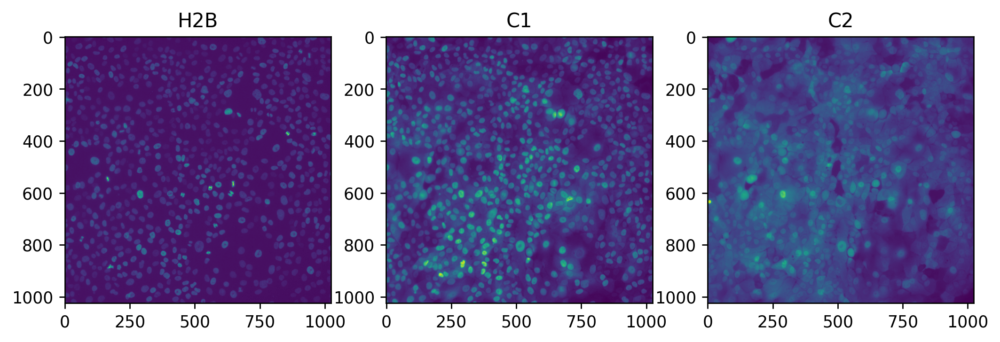

In [50]:
##### CHANGE THIS ######
dim_f = 0  #Position of frame-dimension in tiff_stack
dim_x = 1  #Position of x-dimension in tiff_stack
dim_y = 2  #Position of y-dimension in tiff_stack
dim_c = 3  #Position of channel-dimension in tiff_stack

channels =  { # Name and postition of channel in dataset. Make sure that there is an "H2B"
  "H2B": 0,   
  "C1":  1,
  "C2":  2,
}
########################

n_channels = len(channels)
tiff = io.imread(tiff_file_paths[0])
old_pos = [dim_f,dim_x,dim_y,dim_c] #where axes are
new_pos = [0,    1,    2,    3    ] #where they should be
tiff = np.moveaxis(tiff,old_pos,new_pos)
fig, axs = plt.subplots(figsize=(10, 3), ncols=n_channels,dpi = 250)
for k, v in channels.items():
    channel = tiff[0,:,:,v]
    axs[v].imshow(channel)
    axs[v].set_title(k)
plt.show()
tiff = []

## Define parameters
Set all the variables for the pipeline. If you use multiple CPUs (recomended), be sure to run the notebook server in a slurm session with the flag `--cpus-per-task` (not `--ntasks`), and provide enough memory.

Example code: 
`salloc --mem 200GB -w izbdelhi --time 24:00:00 --cpus-per-task=50`

For the parameters `min_size` and `max_size`: These are the expected sizes of the nuclei. Note: All nuclei get returned, even if they are outside of this margin. The algorithm just tries to split up nuclei larger than `max_size` and gives up once they are smaller than `min_size`.

The parameter `memory` is to use with caution, as many linking errors can arise once if `memory > 0`.

In [52]:
###### CHANGE THIS ######
min_size = 30 #particles smaller are deleted
size_expected = 0 #splitting alg. will try to match this as close as possible. put zero to determine automatically
erosion_levels = range(0,16,1) #these erosion iterations will be applied (start,stop,step)
memory = 0 # max number of frames that a nucleus can disappear and still be assigned the same ID
search_range = 10 # the maximum distance nuclei can move between frames
nb_cores = 5 # number of CPU cores. # use the --cpus-per-task flag in slurm, NOT --ntasks to alow multiple cores

ring_expansion = 8 # how far should the cytosolic ring be expanded (margin will be subtracted)
ring_margin = 2 # margin subtracted from ring to nucleus
# nucleus_margin = 2 # margin subtracted from nucleus #not implemented yet
#########################

## Run the pipeline
The cell below runs the pipeline on all tiff-files stored in `tiff_file_paths`.

Intermediate results are stored in their respective subfolders. To avoid memory leaks in multiprocessing, the stacks are split up into chunks with the `split_stack` function which are then dumped into the `/tmp` subfolder. Each of the subtasks then reads in just one of the chunks, meaning the large stack files don't get multiplied unnecessarily across processes.

### Pandas df where results are stored
- `x` and `y`: position of detected particles
- `size_nuc`: nb pixels belonging to nucleus
- `size_ring`: nb pixels belonging to cytosolic ring
- `frame`: timestep of timelapse movie
- `mean_nuc_X` and `mean_ring_X`, where `X` is a channel name: mean pixel intensities of extracted nuclei and cytosolic rings. Used to calculate ratios. 
- `ratio_X` the  ratio of `mean_nuc` over `mean_ring` of channel `X`.
- `particle`: collumn gets added by trackpy and is the global particla label assigned by trackpy. Continuous between frames.
- `label_frame`: the label initially given after a first segmentation. not continuous between frames!
- `mean_p_nuc`: mean confidence of all pixels belonging to the nucleus


In [12]:
def apply_pipeline(classifier, stack_path,min_size, size_expected, erosion_levels, memory):
    
    ## LOAD IN DATA & PREPROCESS
    fname = os.path.basename(stack_path) #extract the filename
    segmented_stack_path = project_path+"stacks_segmented/"+fname
    stack_labeled_path = project_path+"stacks_labeled/"+fname
    
    stack_raw = io.imread(stack_path)
    stack_raw = stack_raw[:5,:,:,:].copy() #use this to only run on subset of stack
    
    ## Move axes to right place
    old_pos = [dim_f,dim_x,dim_y,dim_c] #where axes are
    new_pos = [0,    1,    2,    3    ] #where they should be
    stack_raw = np.moveaxis(stack_raw,old_pos,new_pos)

    #stack_raw = stack_raw[:5,:,:,:].copy() #only run the first 5 frames
    tmp_path = project_path+"tmp/" #where temporary files are stored
    
    ## APPLY SEMANTIC SEGMENTATION
    c_H2B = channels["H2B"]
    stack_raw = stack_raw[:,:,:,c_H2B].copy()
    chunks = split_stack(stack_raw,tmp_path,nb_cores) #split into chunks
    
    stack_raw = [] # delete stack_raw from memory
    gc.collect()   # run gc

    stack_segmented = apply_semantic_segmentation(chunks, classifier) #segment the chunks    
    io.imsave(segmented_stack_path,stack_segmented) #save stack_segmented
       
    stack_segmented = io.imread(segmented_stack_path)
    
    ## APPLY INSTANCE SEGMENTATION
    #stack_segmented = io.imread(segmented_stack_path) #load stack_segmented
    print("Starting instance segmentation.")
    chunks = split_stack(stack_segmented,tmp_path,nb_cores)
    
    stack_segmented = []
    gc.collect()
    
    stack_labeled = apply_instance_segmentation(chunks,erosion_levels, min_size, size_expected)
    io.imsave(stack_labeled_path,stack_labeled)
      
    
    ## APPLY RING EXTENSION, EXTRACT FEATURES
    stack_raw = io.imread(stack_path)
    stack_raw = np.moveaxis(stack_raw,old_pos,new_pos)
#    stack_raw = stack_raw[:5,:,:,:].copy() #use this to only run on subset of stack
    stack_segmented = io.imread(segmented_stack_path)
    #stack_labeled = io.imread(stack_labeled_path) #usually still loaded 
    
    table_untracked, stack_labeled_rings = apply_feature_extraction(stack_labeled,stack_raw,stack_segmented,channels)
    
    ## save table_untracked and stack_labeled and stack_labeled_rings
    io.imsave(project_path+"stacks_labeled_rings/"+fname,stack_labeled_rings)
    table_untracked.to_pickle(project_path+"table_untracked/"+fname+".pkl")
    
    stack_raw = []       # delete stack_raw from memory
    stack_segmented = [] # delete stack_segmented from memory
    stack_labeled = []   # delete stack_labeled from memory
    stack_labeled_rings = []
    gc.collect()
    
    ## APPLY TRACKING
    table_tracked = tp.link_df(table_untracked, search_range= search_range, memory=memory)
    table_tracked = table_tracked.astype({'particle':'int32'}) #decrease precision
    table_tracked.to_pickle(project_path+"table_tracked/"+fname+".pkl")
    table_tracked.to_csv(project_path+"table_tracked/"+fname+".csv")
    
    table_untracked = [] # delete table_untracked from memory
    table_tracked = []   # delete table_tracked from memory
    gc.collect()
    
    ## CLEANUP
    ## delete temp files
    tmp_files = glob.glob(tmp_path+'*')
    for f in tmp_files:
        os.remove(f)
    print(f"Removed {len(tmp_files)} temporary files.")
    
    
## run pipeline for multiple files:
print(f'Run the pipeline on the following tiff files: {tiff_file_names}')

time_start = time.time()

for stack_path in tiff_file_paths:
    apply_pipeline(classifier, stack_path,min_size, size_expected,erosion_levels, memory)
    gc.collect()
    #break #uncomment to only run on the first file
time_stop = time.time()
time_total =  time_stop - time_start
print("Done. Processing time : "+str(round(time_total/60,2))+" minutes.")

Frame 4: 733 trajectories present.
Removed 5 temporary files.
Done. Processing time : 1.45 minutes.


## Check the results
Below are some plots to check the quality of the results. Select a `file_nb` and `frame_nb`.

In [97]:
###### CHANGE THIS ######
frame_nb = 3 #frame to preview
file_nb = 0  #fov to preview
min_nb_frames = 2 #use this to filter out short tracks
#########################


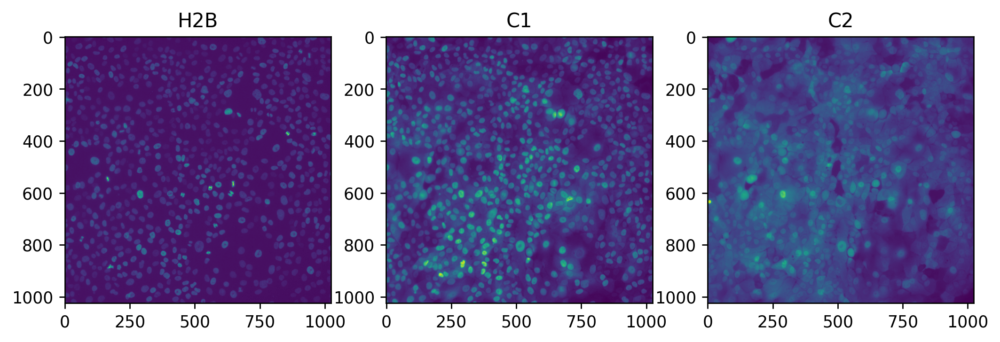

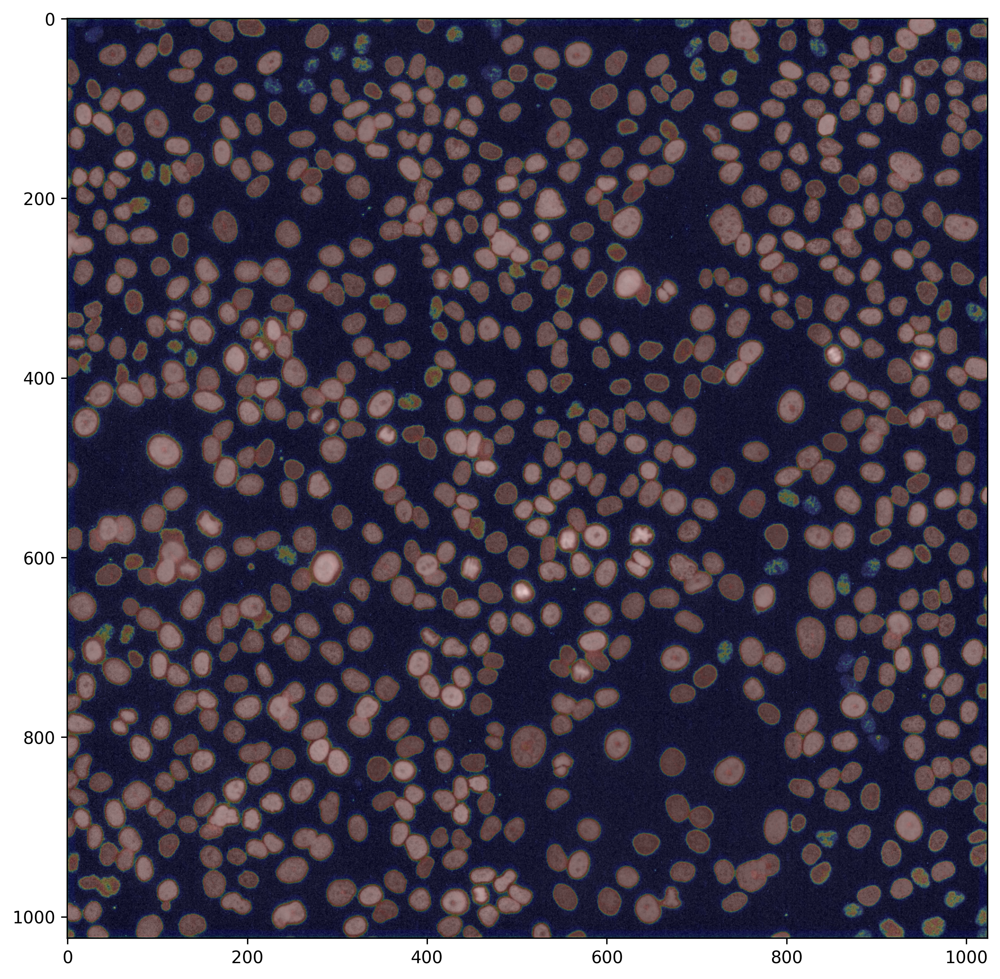

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

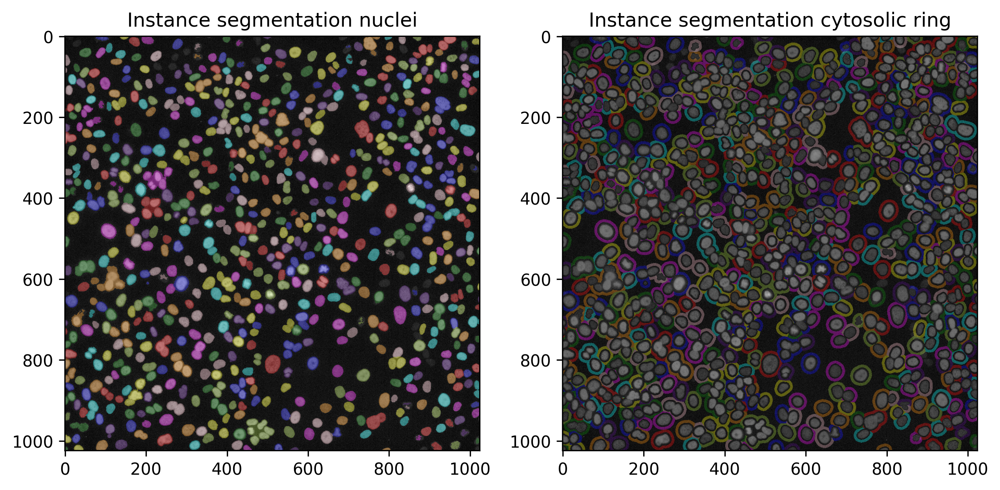

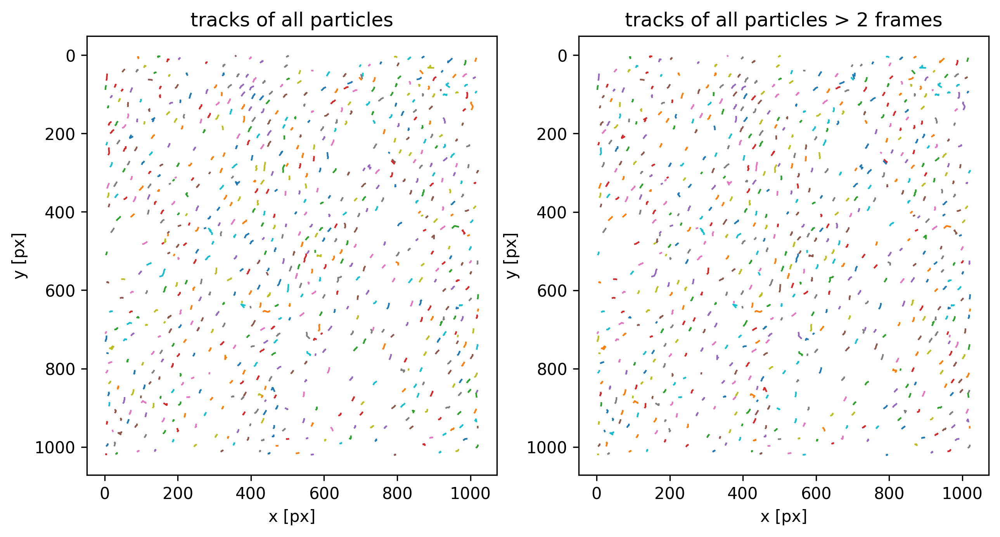

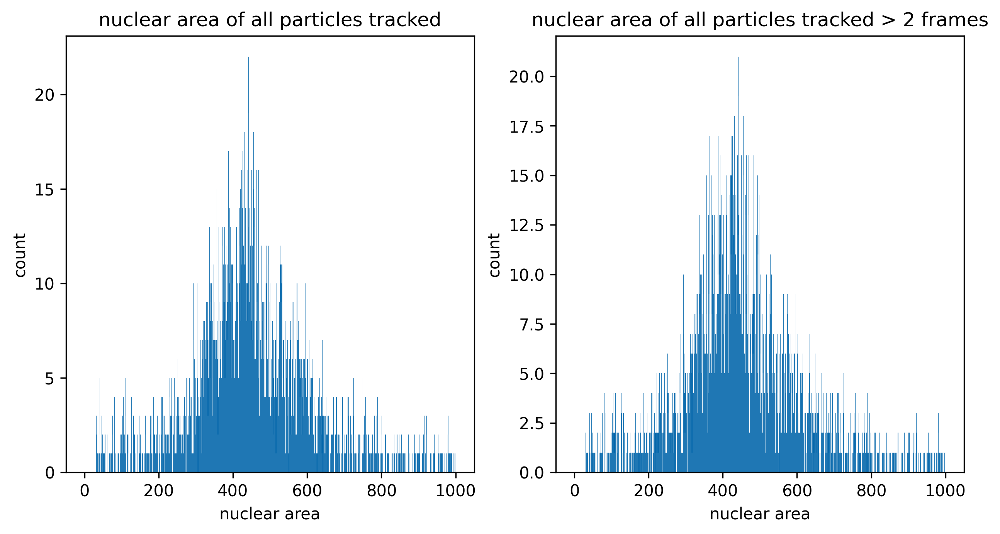

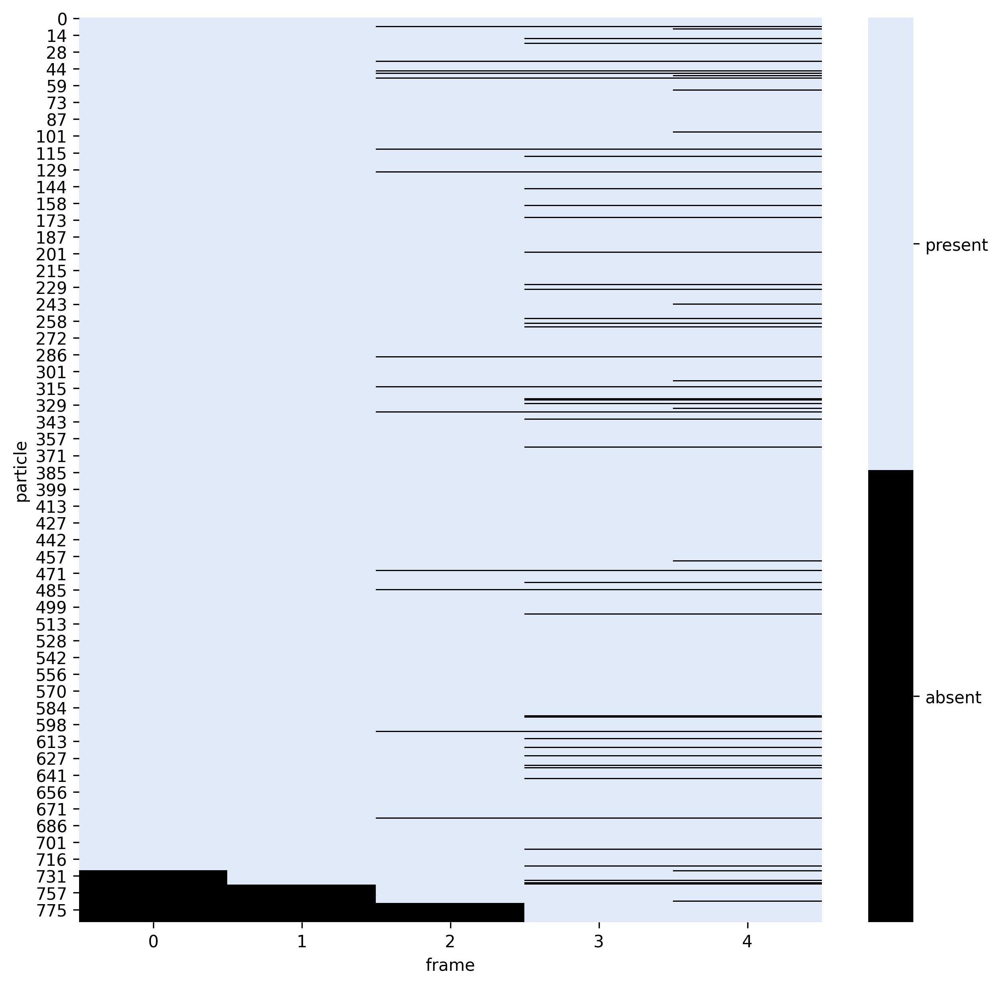

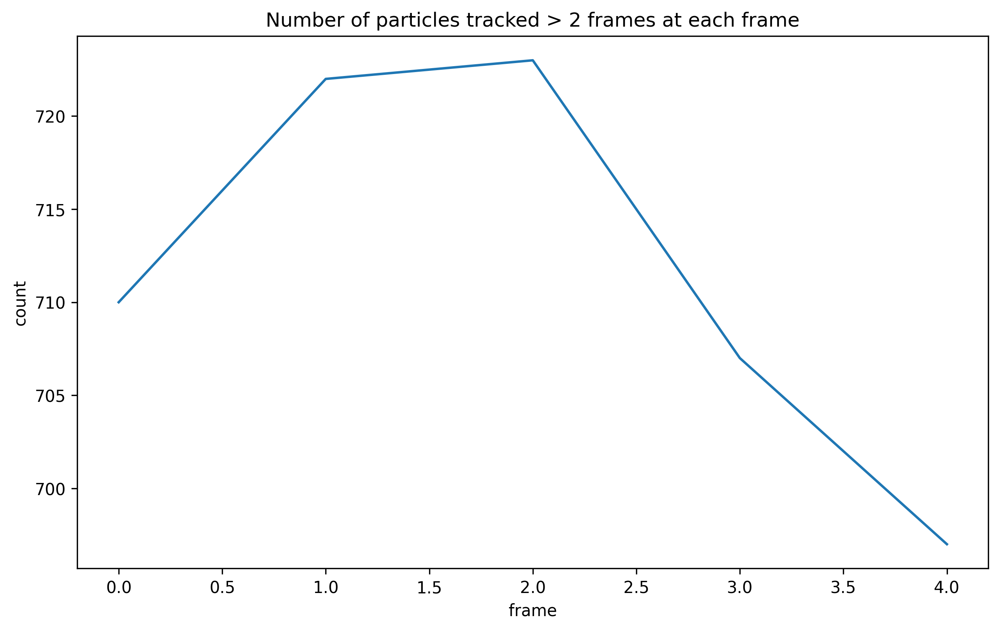

,frame,x,y,mean_p_nuc,size_nuc,size_ring,mean_nuc_C1,mean_ring_C1,ratio_C1,mean_nuc_C2,mean_ring_C2,ratio_C2,label_frame,particle
0,0,755.964147,18.298450,20.506783,1032.0,755.964147,1659.791626,1085.890747,1.528507,2592.327637,1732.310181,1.496457,1,0
480,0,238.181651,640.176147,15.933945,545.0,238.181651,2516.732178,1555.256592,1.618210,3426.154053,3196.941406,1.071697,481,1
481,0,473.679592,637.246939,18.597960,490.0,473.679592,2809.038818,1289.333374,2.178675,3531.508057,2832.636719,1.246721,482,2
482,0,891.205217,641.003478,16.693913,575.0,891.205217,1930.132202,1056.939575,1.826152,2134.606934,1670.360352,1.277932,483,3
483,0,665.646580,642.265472,16.198696,614.0,665.646580,3199.749268,2414.113770,1.325434,1063.767090,1990.205566,0.534501,484,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,4,665.103448,305.091278,22.330629,493.0,665.103448,2904.618652,2177.164551,1.334129,2389.916748,2330.415527,1.025532,247,715
247,4,741.804147,301.179724,18.778801,434.0,741.804147,1576.841064,1063.496704,1.482695,2594.852539,2251.080078,1.152714,248,716
248,4,146.581448,309.124434,19.158371,442.0,146.581448,2365.891357,1413.004028,1.674370,3419.846191,3226.445801,1.059942,249,720
250,4,897.920482,307.137349,18.207230,415.0,897.920482,1349.354248,882.492859,1.529026,2335.252930,2090.342773,1.117163,251,719


In [98]:
## LOAD THE DATA
test_file = tiff_file_paths[file_nb]
test_file_name = os.path.basename(test_file)

test_stack_raw = io.imread(project_path+"stacks_raw/"+test_file_name)
c_H2B = channels["H2B"]
f_raw = test_stack_raw[frame_nb,:,:,c_H2B].copy() #select nuclear channel
#f_raw_c1 = test_stack_raw[frame_nb,:,:,0].copy()
#f_raw_c2 = test_stack_raw[frame_nb,:,:,0].copy()
#test_stack_raw = []

test_stack_segmented = io.imread(project_path+"stacks_segmented/"+test_file_name)
f_segmented = test_stack_segmented[frame_nb,:,:].copy()
test_stack_segmented = []

test_stack_labeled = io.imread(project_path+"stacks_labeled/"+test_file_name)
f_labeled = test_stack_labeled[frame_nb,:,:].copy()
test_stack_labeled = []

test_stack_labeled_rings = io.imread(project_path+"stacks_labeled_rings/"+test_file_name)
f_labeled_rings = test_stack_labeled_rings[frame_nb,:,:].copy()
test_stack_labeled_rings = []

table_tracked = pd.read_pickle(project_path+"table_tracked/"+test_file_name+".pkl")

img_adapteq = exposure.equalize_adapthist(f_raw, clip_limit=0.03)
f_raw_scaled = img_adapteq#*255
f_raw_scaled= f_raw_scaled#.astype(int)

## PRODUCE THE PLOTS
# Original image, all 3 channels
n_channels = len(channels)
old_pos = [dim_f,dim_x,dim_y,dim_c] #where axes are
new_pos = [0,    1,    2,    3    ] #where they should be
tiff = np.moveaxis(test_stack_raw,old_pos,new_pos)
fig, axs = plt.subplots(figsize=(10, 3), ncols=n_channels,dpi = 250)
for k, v in channels.items():
    channel = test_stack_raw[0,:,:,v]
    axs[v].imshow(channel)
    axs[v].set_title(k)
plt.show()
tiff = []
test_stack_raw = []

# Prediction probability overlay
plt.figure(figsize=(10, 10),dpi = 300)
alpha = 0.8
f_raw_scaled3 =  np.stack((f_raw_scaled,)*3, axis=-1)
prediction3 = cv2.applyColorMap(f_segmented, cv2.COLORMAP_JET)
f_raw_scaled3 = f_raw_scaled3*255
f_raw_scaled3 = f_raw_scaled3.astype('uint8')
prediction3 = prediction3.astype('uint8')
dest = cv2.addWeighted(f_raw_scaled3, alpha, prediction3, 1 - alpha,0)
plt.imshow(dest)
plt.show()


#instance segmentation overlay
plt.figure(figsize = (20,20))
label_img = label2rgb(f_labeled,image = f_raw_scaled,bg_label=0,image_alpha=1)

#ring extension segmentation overlay
plt.figure(figsize = (20,20))
label_img_rings = label2rgb(f_labeled_rings,f_raw_scaled,bg_label=0,image_alpha=1)

fig, (ax1, ax2) = plt.subplots(figsize=(10, 5), ncols=2,dpi = 300)
ax1.imshow(label_img)
ax1.set_title("Instance segmentation nuclei")
ax2.imshow(label_img_rings)
ax2.set_title("Instance segmentation cytosolic ring")
plt.show()


#trajectories of all particles and particles tracked longer than > min_nb_frames
table_tracked_min_nb_frames = tp.filter_stubs(table_tracked, min_nb_frames)

fig, (ax1, ax2) = plt.subplots(figsize=(10, 5), ncols=2,dpi = 300)
ax1 = tp.plot_traj(table_tracked, ax=ax1, plotstyle= {"legend": "before filtering"})
ax2 = tp.plot_traj(table_tracked_min_nb_frames, ax=ax2, plotstyle= {"legend": "after filtering"})
ax1.set_title("tracks of all particles")
ax2.set_title(f"tracks of all particles > {min_nb_frames} frames")
plt.show()


fig, (ax1, ax2) = plt.subplots(figsize=(10, 5), ncols=2,dpi = 300)
ax1.hist(table_tracked['size_nuc'], bins=1000,range = (0,1000))
ax1.set_xlabel("nuclear area")
ax1.set_ylabel("count")
ax1.set_title("nuclear area of all particles tracked")
ax2.hist(table_tracked_min_nb_frames['size_nuc'], bins=1000,range = (0,1000))
ax2.set_xlabel("nuclear area")
ax2.set_ylabel("count")
ax2.set_title(f"nuclear area of all particles tracked > {min_nb_frames} frames")
plt.show()



#presence and absence of particles
tracks=table_tracked_min_nb_frames.reset_index(drop=True)
df = tracks[["particle","frame"]]
co_mat = pd.crosstab(df.particle, df.frame)
#https://stackoverflow.com/questions/36227475/heatmap-like-plot-but-for-categorical-variables-in-seaborn
n = 2   
# discrete colormap (n samples from a given cmap)
#cmap = sns.color_palette("rocket", n) 
colors = ["#000000", "#dfe9f8"]
sns.set_palette(sns.color_palette(colors))
plt.figure(figsize = (10,10),dpi = 300)
ax = sns.heatmap(co_mat,cmap = colors) 
# modify colorbar:
colorbar = ax.collections[0].colorbar 
r = colorbar.vmax - colorbar.vmin 
colorbar.set_ticks([colorbar.vmin + r / n * (0.5 + i) for i in range(n)])
colorbar.set_ticklabels(["absent","present"])                                          
plt.show()
sns.set_palette(sns.color_palette("tab10"))

plt.figure(figsize = (10,6),dpi = 300)
plt.title(f'Number of particles tracked > {min_nb_frames} frames at each frame')
co_mat.sum().plot()
plt.xlabel("frame")
plt.ylabel("count")
plt.show()

table_tracked
